In [1]:
# import numpy as np

# # !/usr/bin/env python3
# # -*- coding: utf-8 -*-
# """
# Created on 20181219

# @author: zhangji

# Trajection of a ellipse, Jeffery equation. 
# """

# %pylab inline
# pylab.rcParams['figure.figsize'] = (25, 11)
# fontsize = 40

# import numpy as np
# import scipy as sp
# from scipy.optimize import leastsq, curve_fit
# from scipy import interpolate
# from scipy.interpolate import interp1d
# from scipy.io import loadmat, savemat
# # import scipy.misc

# import matplotlib
# from matplotlib import pyplot as plt
# from matplotlib import animation, rc
# import matplotlib.ticker as mtick
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
# from mpl_toolkits.mplot3d import Axes3D, axes3d

# from sympy import symbols, simplify, series, exp
# from sympy.matrices import Matrix
# from sympy.solvers import solve

# from IPython.display import display, HTML
# from tqdm import tqdm_notebook as tqdm
# import pandas as pd
# import re
# from scanf import scanf
# import os
# import glob

# from codeStore import support_fun as spf
# from src.support_class import *
# from src import stokes_flow as sf

# rc('animation', html='html5')
# PWD = os.getcwd()
# font = {'size': 20}
# matplotlib.rc('font', **font)
# np.set_printoptions(linewidth=90, precision=5)

%load_ext autoreload
%autoreload 2

import os
import glob
import natsort 
import numpy as np
import scipy as sp
from scipy.optimize import leastsq, curve_fit
from scipy import interpolate, integrate
from scipy import spatial, signal
# from scipy.interpolate import interp1d
from scipy.io import loadmat, savemat
# import scipy.misc
# import importlib
from IPython.display import display, HTML
import pandas as pd
import pickle
import re
from scanf import scanf

import matplotlib
# matplotlib.use('agg')
from matplotlib import pyplot as plt
import matplotlib.colors as colors
from matplotlib import animation, rc
import matplotlib.ticker as mtick
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
from mpl_toolkits.mplot3d import Axes3D, axes3d
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from mpl_toolkits.mplot3d.art3d import Line3DCollection
from matplotlib import cm

from tqdm.notebook import tqdm as tqdm_notebook
from tqdm import tqdm
from time import time
from src.support_class import *
from src import jeffery_model as jm
from codeStore import support_fun as spf
from codeStore import support_fun_table as spf_tb

# %matplotlib notebook
%matplotlib inline
rc('animation', html='html5')
fontsize = 40
PWD = os.getcwd()

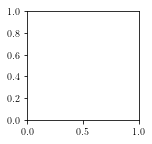

In [2]:
fig = plt.figure(figsize=(2, 2))
fig.patch.set_facecolor('white')
ax0 = fig.add_subplot(1, 1, 1)

In [3]:
job_dir = 'ecoC01B05_passive_psi-0a'
table_name = 'ecoC01B05_tao1_wm0'
t_headle = '(.*?).pickle'

In [4]:
t_dir = os.path.join(PWD, job_dir)

data = spf_tb.load_table_data_pickle_dir(t_dir, t_headle)
lst_eta = data.lst_eta
theta_max_fre = data.theta_max_fre
phi_max_fre = data.phi_max_fre
psi_max_fre = data.psi_max_fre
eta_max_fre = data.eta_max_fre
data_idx = data.data_idx.fillna(-1).astype(int)

-ini_theta 0.000000 -ini_phi 0.000000 -ini_psi 3.141593


True

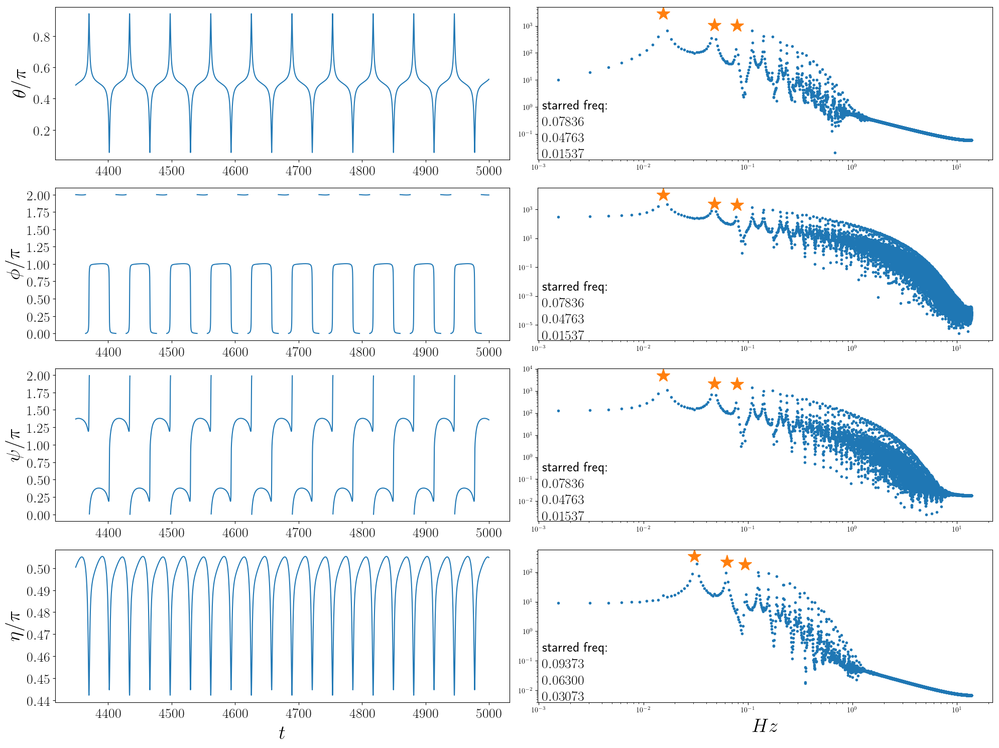

In [7]:
theta, phi = 0.0, 1.714

tpick, _ = spf_tb.load_table_date_pickle(job_dir, theta, phi)
Table_t = tpick['Table_t']
Table_dt = tpick['Table_dt']
Table_X = tpick['Table_X']
Table_P = tpick['Table_P']
Table_P2 = tpick['Table_P2']
Table_theta = tpick['Table_theta']
Table_phi = tpick['Table_phi']
Table_psi = tpick['Table_psi']
Table_eta = tpick['Table_eta']
print('-ini_theta %f -ini_phi %f -ini_psi %f' % 
      (tpick['Table_theta'][0], tpick['Table_phi'][0], tpick['Table_psi'][0]))

freq_pk = spf_tb.get_major_fre(Table_t, Table_theta)
idx = Table_t > Table_t.max() - 1 / freq_pk * 10
# spf_tb.show_table_result(Table_t[idx], Table_dt[idx], Table_X[idx], Table_P[idx], Table_P2[idx], 
#                          Table_theta[idx], Table_phi[idx], Table_psi[idx], Table_eta[idx], save_every)
# spf_tb.show_theta_phi(Table_t[idx], Table_dt[idx], Table_X[idx], Table_P[idx], Table_P2[idx], 
#                       Table_theta[idx], Table_phi[idx], Table_psi[idx], Table_eta[idx], show_back_direction=False)
spf_tb.show_theta_phi_psi_eta(Table_t[idx], Table_dt[idx], Table_X[idx], Table_P[idx], Table_P2[idx], 
                              Table_theta[idx], Table_phi[idx], Table_psi[idx], Table_eta[idx])
# spf_tb.show_center_X(Table_t[idx], Table_dt[idx], Table_X[idx], Table_P[idx], Table_P2[idx], 
#                      Table_theta[idx], Table_phi[idx], Table_psi[idx], Table_eta[idx], 
#                      table_name=table_name)

In [31]:
f

array([0.00000000e+00, 1.71060853e-03, 3.42121706e-03, ...,
       7.00323133e+00, 7.00494194e+00, 7.00665255e+00])

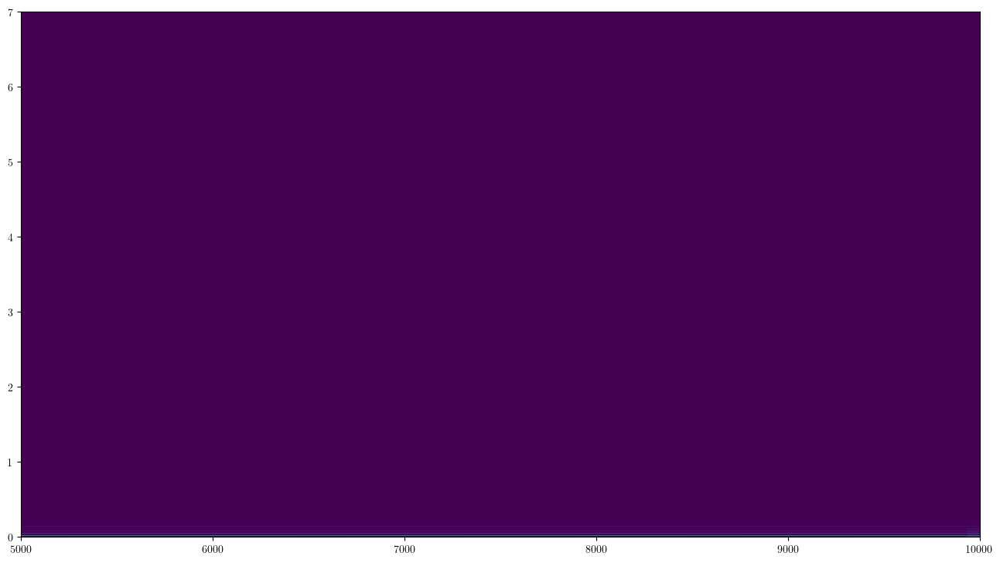

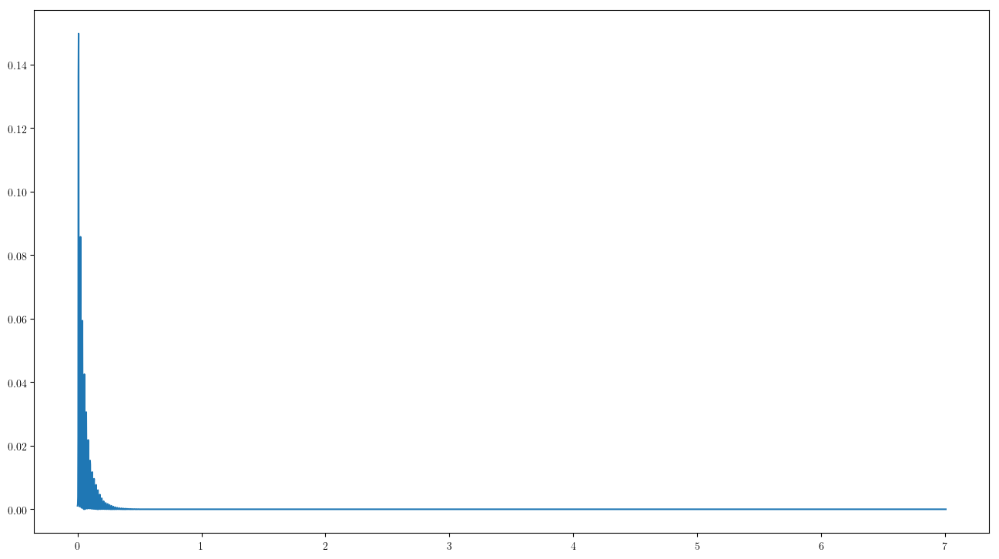

In [39]:
figsize = np.array((16, 9)) * 1
dpi = 100

resamp_theta = spf_tb.get_continue_angle(Table_t, Table_theta)
fs = resamp_theta.size / Table_t.max() / 2
f, t, Zxx = signal.stft(np.cos(resamp_theta), fs=fs, nperseg=2**13)

fig, axs = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
axi = axs
axi.pcolormesh(t, f, np.abs(Zxx))
axi.set_xlim(5000, 10000)
# axi.set_ylim(0, 0.1)
# axi.set_yscale('log')

In [102]:
14 / 0.016 * 4

3500.0

[0.4617505  0.40895383]


Text(0.005145975233880607, 4.935046782540978e-19, 'starred freq: \n$0.92107$\n$0.86806$\n$0.05301$')

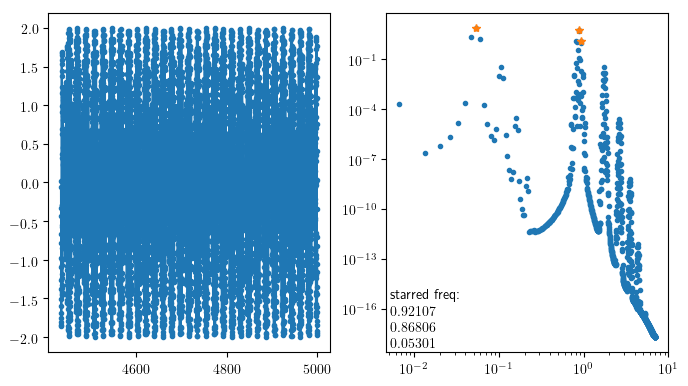

In [143]:
figsize = np.array((16, 9)) * 0.5
dpi = 100
show_prim_freq = 3

use_t = np.linspace(Table_t.min(), Table_t.max(), 1 * Table_t.size)
# resamp_theta = spf_tb.get_continue_angle(Table_t, Table_theta, use_t)
taaa = np.random.sample(2)
print(taaa)
resamp_theta = np.cos(use_t * taaa[0] * 2 * np.pi) + np.cos(use_t * taaa[1] * 2 * np.pi)
ty = np.cos(resamp_theta)
# ty = resamp_theta

tmin = np.max((0, use_t.max() - 1000))
idx = use_t > tmin
freq_pk = spf_tb.get_major_fre(use_t[idx], ty[idx])
idx = use_t > (Table_t.max() - 1 / freq_pk * 30)
# tfft = np.fft.rfft(ty[idx])

fs = ty[idx].size / (use_t[idx].max() - use_t[idx].min())
nperseg = fs / freq_pk * 8
f2, Pxx_den = signal.welch(ty[idx], fs=fs, nperseg=nperseg)

fig, axs = plt.subplots(1, 2, figsize=figsize, dpi=dpi)
axi = axs[0]
axi.plot(use_t[idx], resamp_theta[idx], '.-')

axi = axs[1]
axi.loglog(f2, Pxx_den, '.')
tpk = signal.find_peaks(Pxx_den)[0]
fft_abs_pk = Pxx_den[tpk]
freq_pk = f2[tpk]
tidx = np.argsort(fft_abs_pk)[-show_prim_freq:]
axi.loglog(freq_pk[tidx], fft_abs_pk[tidx], '*')
t1 = 'starred freq: \n' + '\n'.join(['$%.5f$' % freq_pk[ti] for ti in tidx])
axi.text(axi.get_xlim()[0] * 1.1, axi.get_ylim()[0] * 2, t1)


In [131]:
0.949 / 0.15

6.326666666666666

In [89]:
tpk = signal.find_peaks(ty[idx])[0]
fft_abs_pk = tfft_abs[tpk]
freq_pk = tfreq[tpk]
tidx = np.argsort(fft_abs_pk)[-show_prim_freq:]
ax1.loglog(freq_pk[tidx], fft_abs_pk[tidx], '*')

array([ 380, 1276, 2172, 3068, 3964, 4860, 5756, 6652, 7548, 8444])

In [5]:
# put images with same frequence into a subdirect
check_fre_list = [0.0160, 0.0190, 0.0203, 0.0632]
atol_fre_list =  [0.0001, 0.0001, 0.0008, 0.0008]
Table_t_range = np.array((4500, np.inf))

def sub_seperate_0(i1, type_fre, iidx, Table_t_range):
    t1 = np.zeros_like(iidx[0])
    return t1

def sub_seperate_1(i1, type_fre, iidx, Table_t_range):
    theta = type_fre.index.values[iidx[0]]
    phi = type_fre.columns.values[iidx[1]]
    theta_phi_list = np.vstack((theta, phi)).T
    tuse = []
    for theta, phi in tqdm_notebook(theta_phi_list, desc='No. %d  ' % i1):
        tpick, _ = spf_tb.load_table_date_pickle(job_dir, theta, phi)
        Table_t = tpick['Table_t']
        Table_theta = tpick['Table_theta']
        Table_phi = tpick['Table_phi']
        Table_psi = tpick['Table_psi']
        
        idx = np.logical_and(Table_t >= Table_t_range[0], Table_t <= Table_t_range[1])
        tuse.append(np.max(Table_theta[idx]))
    tuse = np.hstack(tuse)
    t1 = np.ones_like(tuse)
    t1[tuse < 1.6] = 0
    t1[tuse > 1.934] = 2
    return t1

def sub_seperate_2(i1, type_fre, iidx, Table_t_range):
    theta = type_fre.index.values[iidx[0]]
    phi = type_fre.columns.values[iidx[1]]
    theta_phi_list = np.vstack((theta, phi)).T
    tuse = []
    for theta, phi in tqdm_notebook(theta_phi_list, desc='No. %d  ' % i1):
        tpick, _ = spf_tb.load_table_date_pickle(job_dir, theta, phi)
        Table_t = tpick['Table_t']
        Table_theta = tpick['Table_theta']
        Table_phi = tpick['Table_phi']
        Table_psi = tpick['Table_psi']
        
        idx = np.logical_and(Table_t >= Table_t_range[0], Table_t <= Table_t_range[1])
        tuse.append(np.max(Table_phi[idx]))
    tuse = np.hstack(tuse)
    t1 = np.ones_like(tuse)
    t1[tuse < 4] = 0
    t1[tuse > 5.1] = 2
    return t1
    
sub_seperate = {0: sub_seperate_0, 
                1: sub_seperate_1, 
                2: sub_seperate_2, 
                3: sub_seperate_0, }

tfre = theta_max_fre.copy()
type_fre = tfre.copy()
type_fre.iloc[:, :] = -1
i0 = 0
process_total = 0
for i1, (check_fre, atol_fre) in enumerate(zip(check_fre_list[:], atol_fre_list)):
    use_idx = np.isclose(tfre, check_fre, rtol=0, atol=atol_fre)
    iidx = np.where(use_idx)
    process_total = process_total + np.sum(use_idx)
    t1 = sub_seperate[i1](i1, type_fre, iidx, Table_t_range)
    type_fre.iloc[use_idx] = i0 + t1
    i0 = i0 + 1 + np.max(t1)

# plot one of the remaind cases
if np.any(type_fre.values == -1):
    pass

assert np.any(type_fre.values > 0)

type_fre2 = type_fre.copy()
type_fre2.iloc[type_fre.values == 0] = 0
type_fre2.iloc[type_fre.values == 1] = 1
type_fre2.iloc[type_fre.values == 2] = 2
type_fre2.iloc[type_fre.values == 3] = 3
type_fre2.iloc[type_fre.values == 4] = 1
type_fre2.iloc[type_fre.values == 5] = 1
type_fre2.iloc[type_fre.values == 6] = 4
type_fre2.iloc[type_fre.values == 7] = 1
spf_tb.show_traj_phase_map_type(type_fre2)
# spf_tb.save_separate_angleList_fft(job_dir, tfre, check_fre_list, atol_fre_list)

NameError: name 'theta_max_fre' is not defined

In [7]:
t1 = []
for i0 in np.arange(type_fre2.values.max() + 1):
    t1.append(np.isclose(type_fre2.values, i0).sum())

print(np.sum(t1))
print(t1)
print(t1 / np.sum(t1))

1035
[275, 47, 232, 320, 161]
[0.26570048 0.04541063 0.22415459 0.30917874 0.15555556]


-ini_theta 0.000000 -ini_phi 1.714000
-ini_theta 0.000000 -ini_phi 0.000000 -ini_psi 3.141593
-ini_theta 0.000000 -ini_phi 0.000000
-ini_theta 0.000000 -ini_phi 0.000000 -ini_psi 0.000000
-ini_theta 0.143000 -ini_phi 0.000000
-ini_theta 0.142800 -ini_phi 6.283185 -ini_psi 0.000000
-ini_theta 0.143000 -ini_phi 0.428000
-ini_theta 0.142800 -ini_phi 0.428399 -ini_psi 0.000000
-ini_theta 0.143000 -ini_phi 0.571000
-ini_theta 0.142800 -ini_phi 0.571199 -ini_psi 0.000000


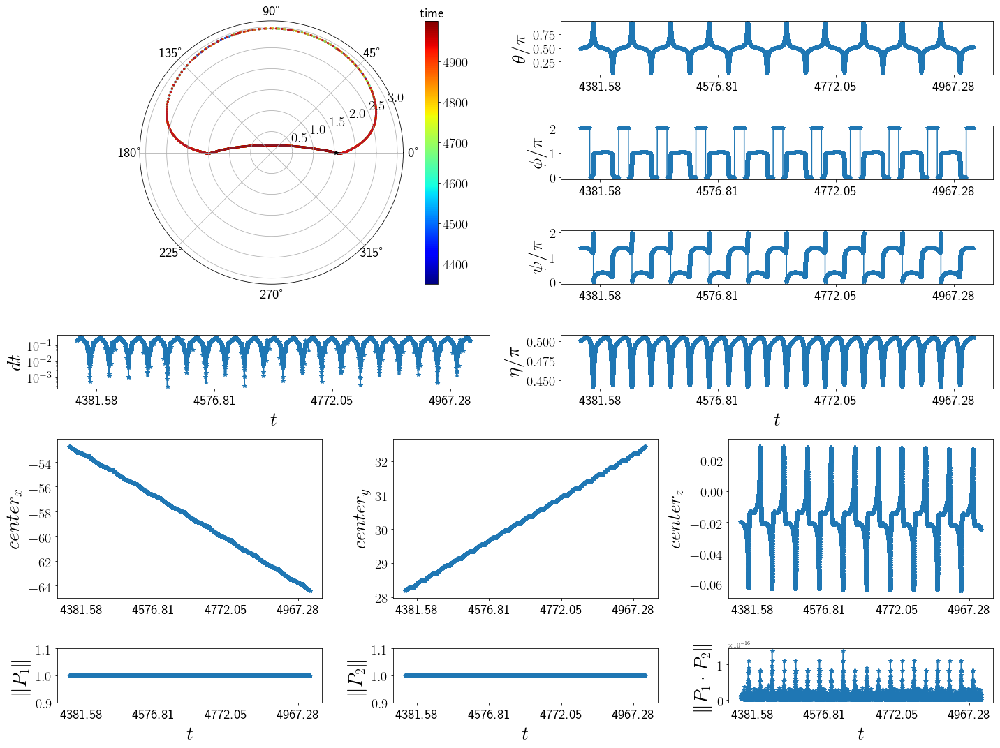

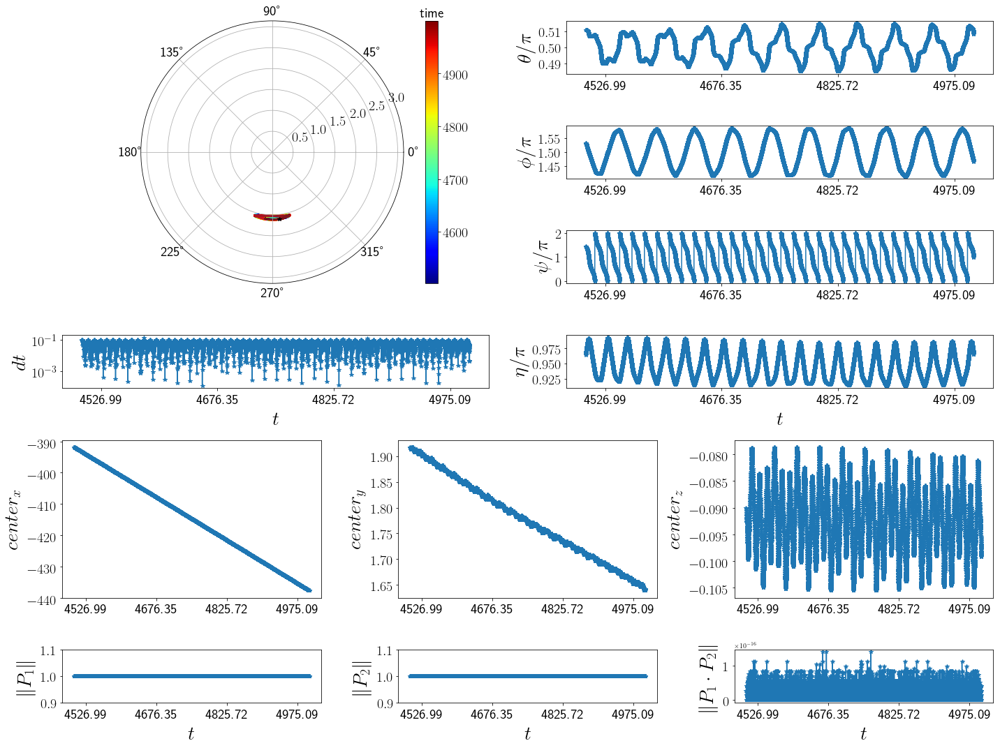

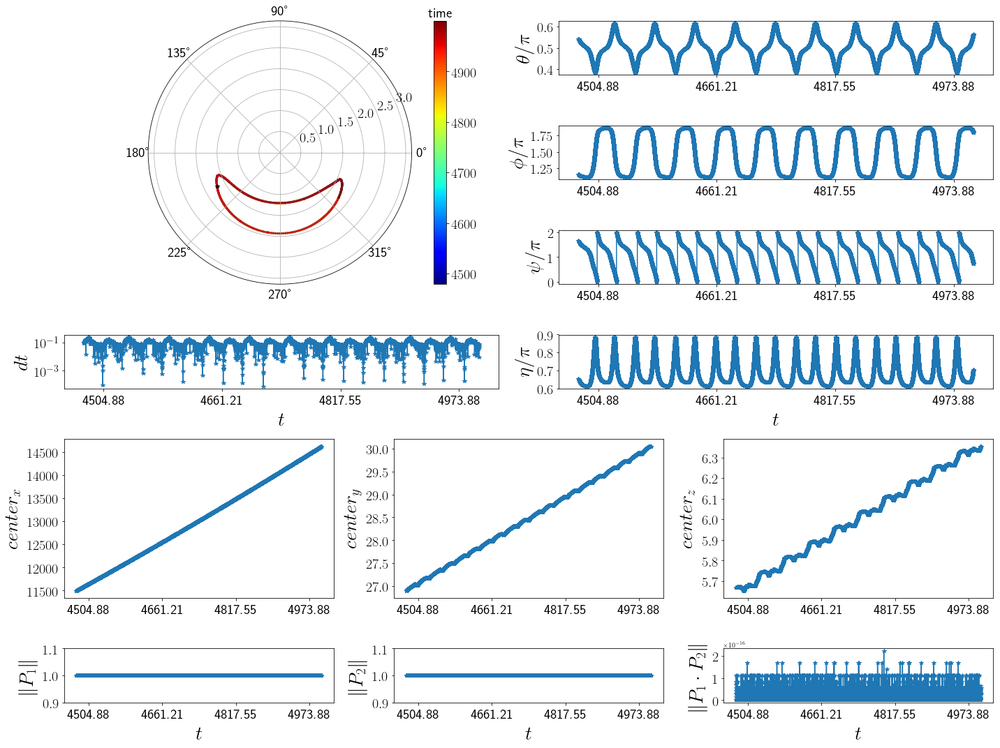

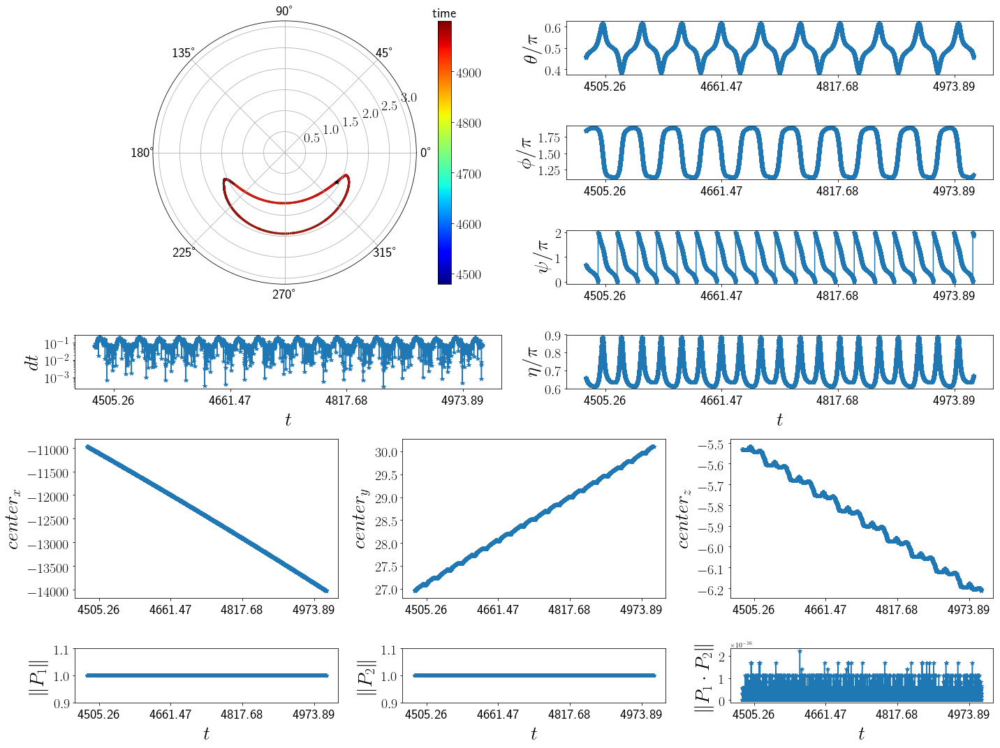

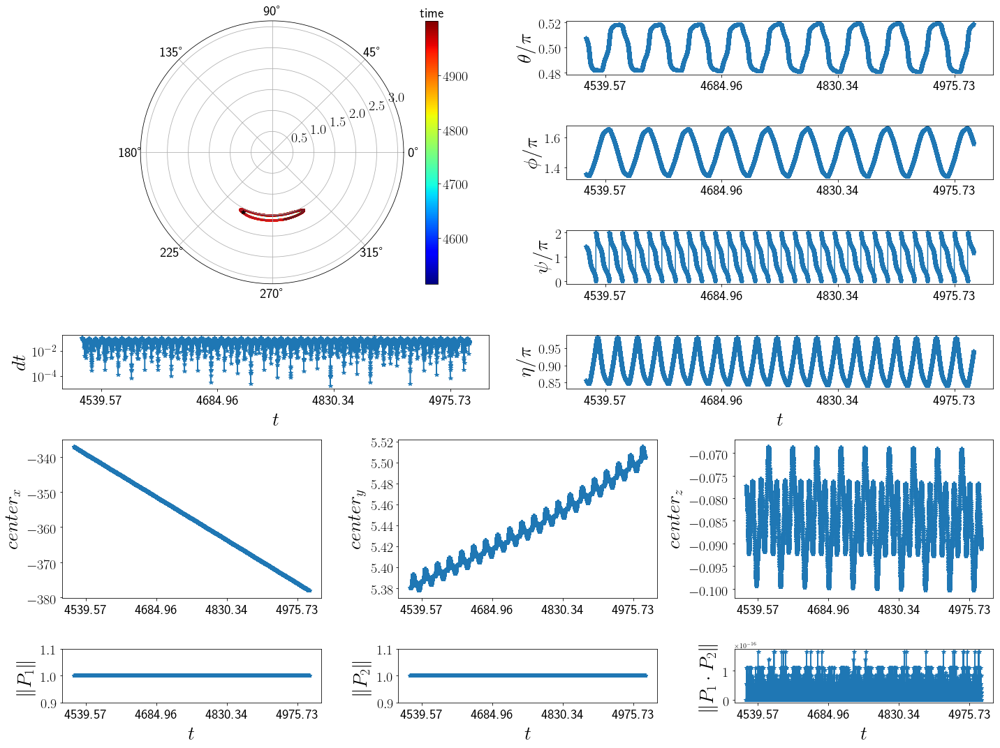

In [10]:
nshow = np.inf
# nshow = 2
fast_mode1 = 1
figsize = np.array((16, 9)) * 0.5
dpi = 200

tipical_th_ph_list = []
for i0 in np.arange(type_fre2.values.max() + 1)[:]:
    iidx = np.where(np.isclose(type_fre2.values, i0))
    spf_tb.phase_map_show_idx(type_fre2, tipical_th_ph_list, iidx, job_dir, table_name, fast_mode=fast_mode1, )

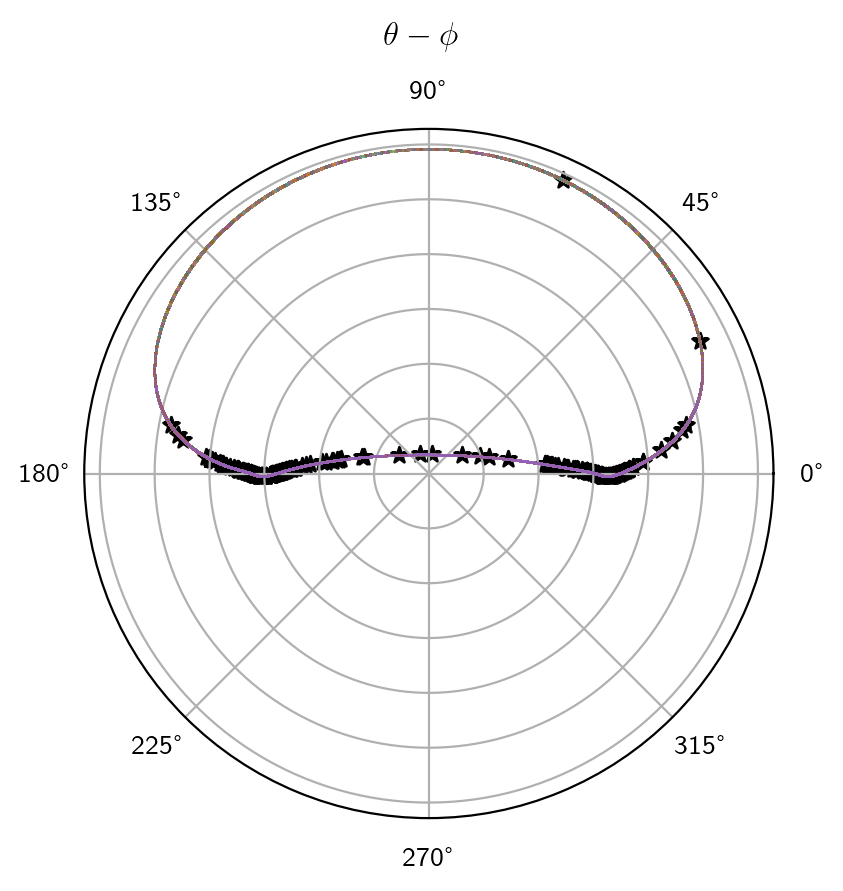

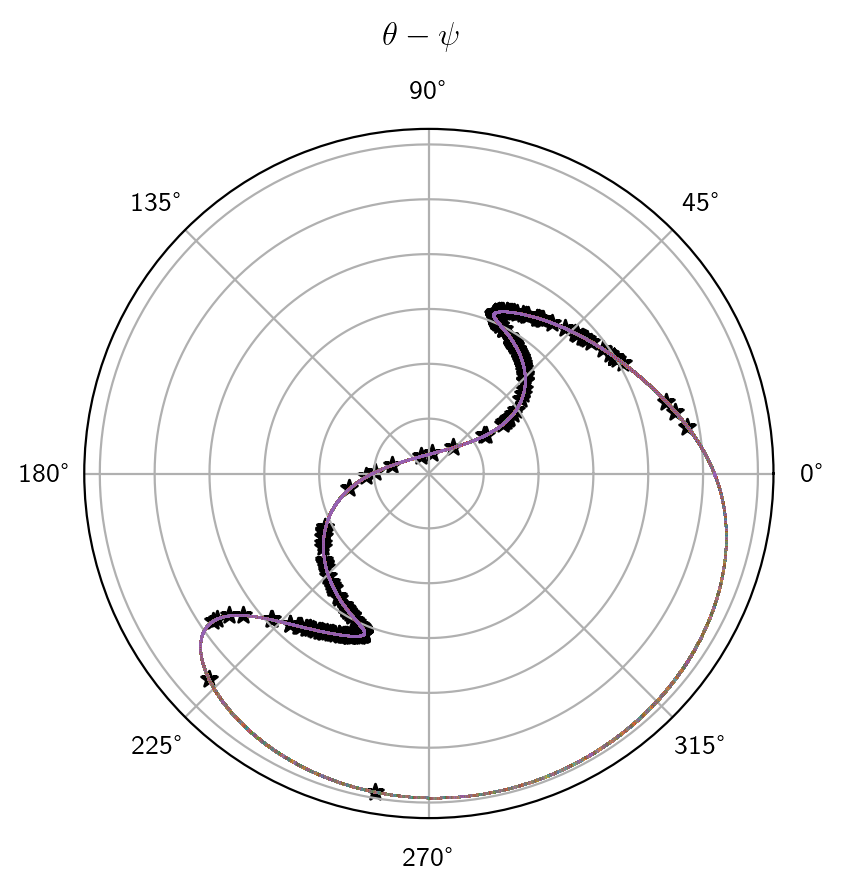

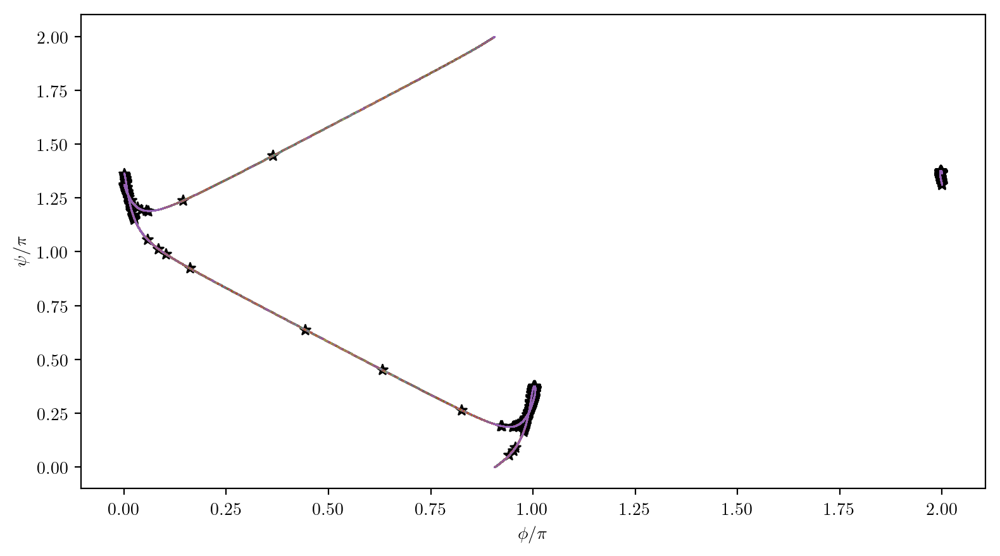

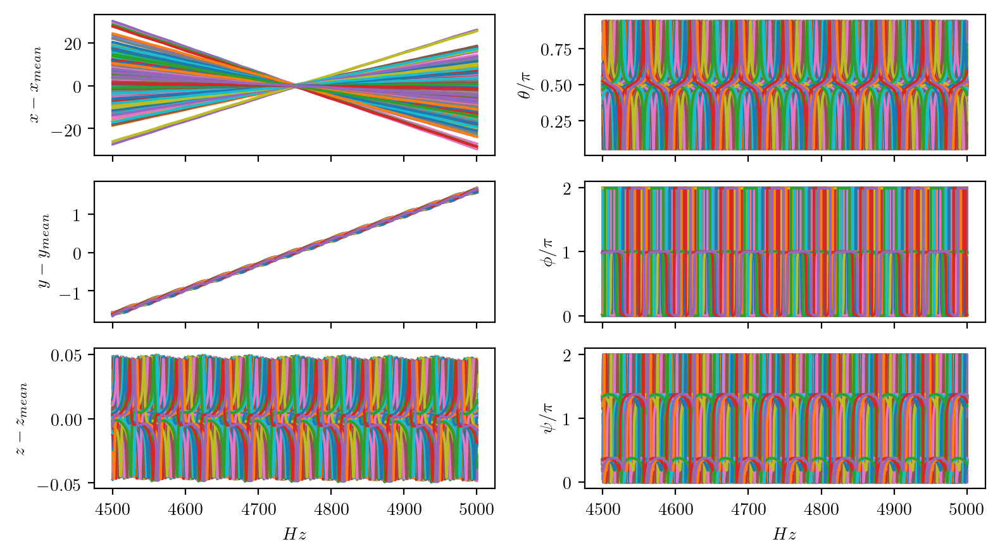

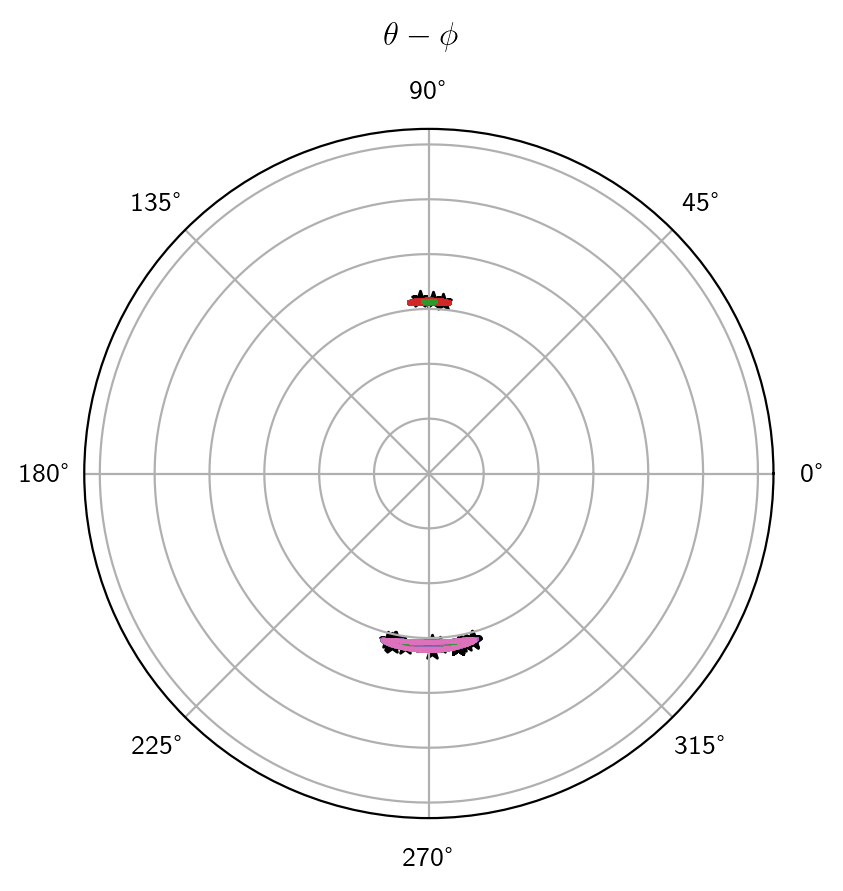

...

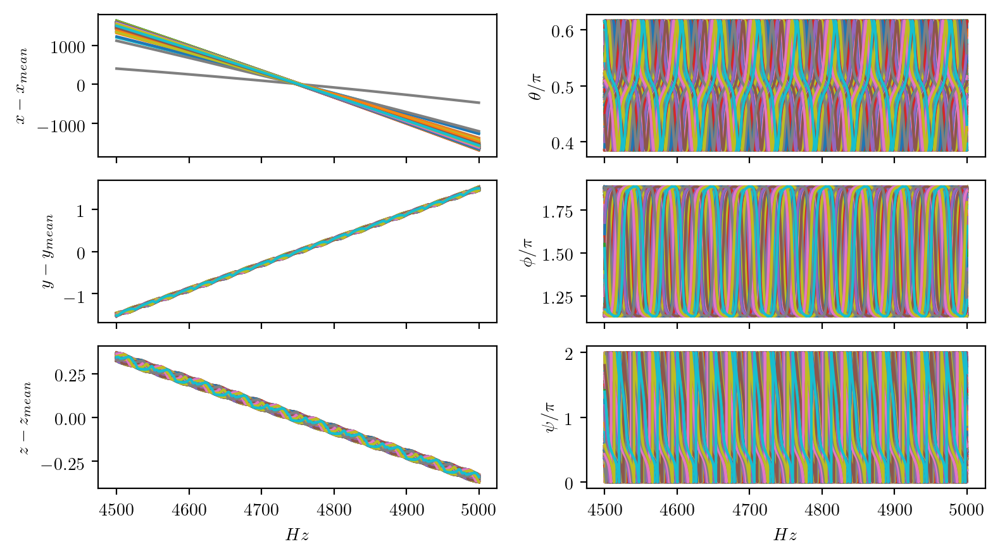

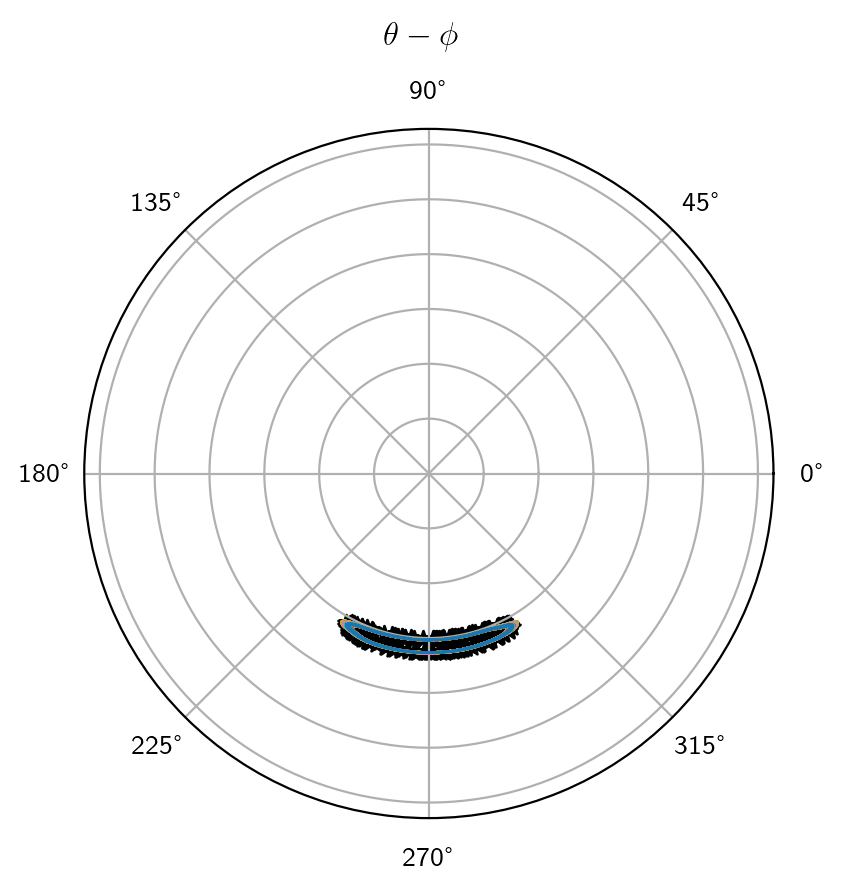

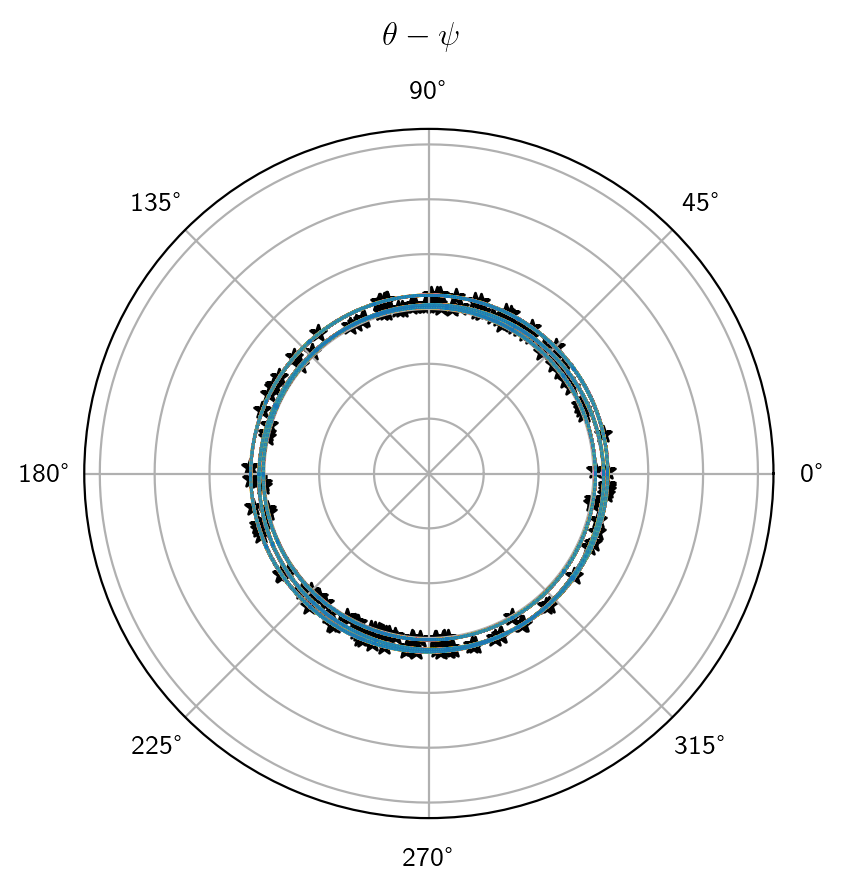

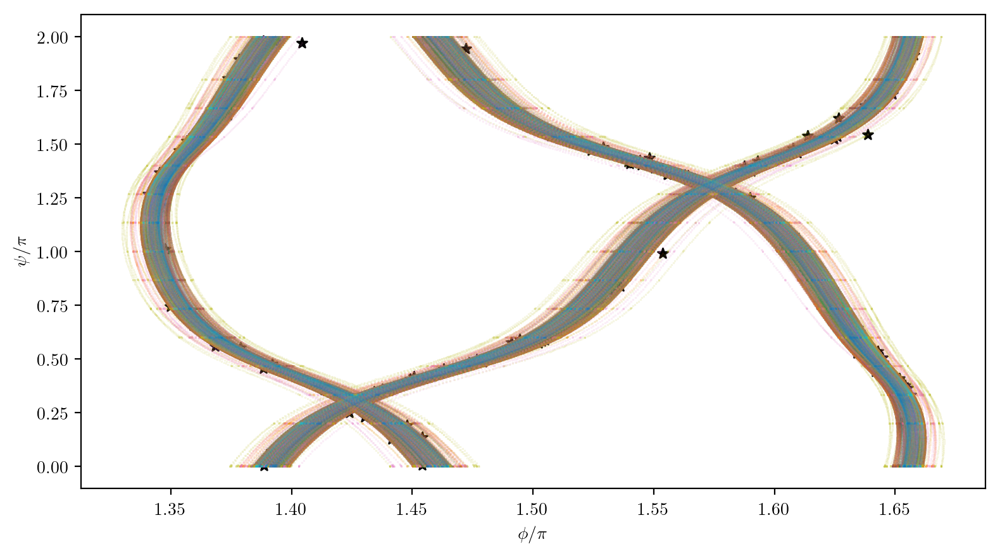

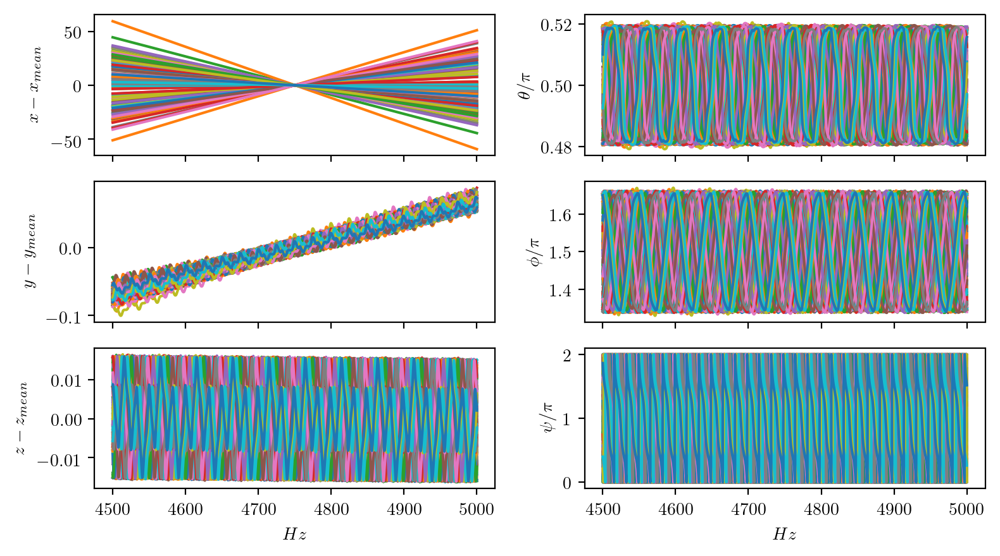

In [18]:
Table_t_range1 = np.array((4500, np.inf))
Table_t_range2 = np.array((4500, np.inf))
nshow = np.inf
# nshow = 2
fast_mode2 = True
figsize = np.array((16, 9)) * 0.5
dpi = 200

for i0 in np.arange(type_fre2.values.max() + 1)[:]:
    iidx = np.where(np.isclose(type_fre2.values, i0))
    spf_tb.phase_map_show_idx_list(type_fre2, iidx, job_dir, nshow=nshow, figsize=figsize, dpi=dpi, 
                                   Table_t_range1=Table_t_range1, Table_t_range2=Table_t_range2, fast_mode=fast_mode2, )

True

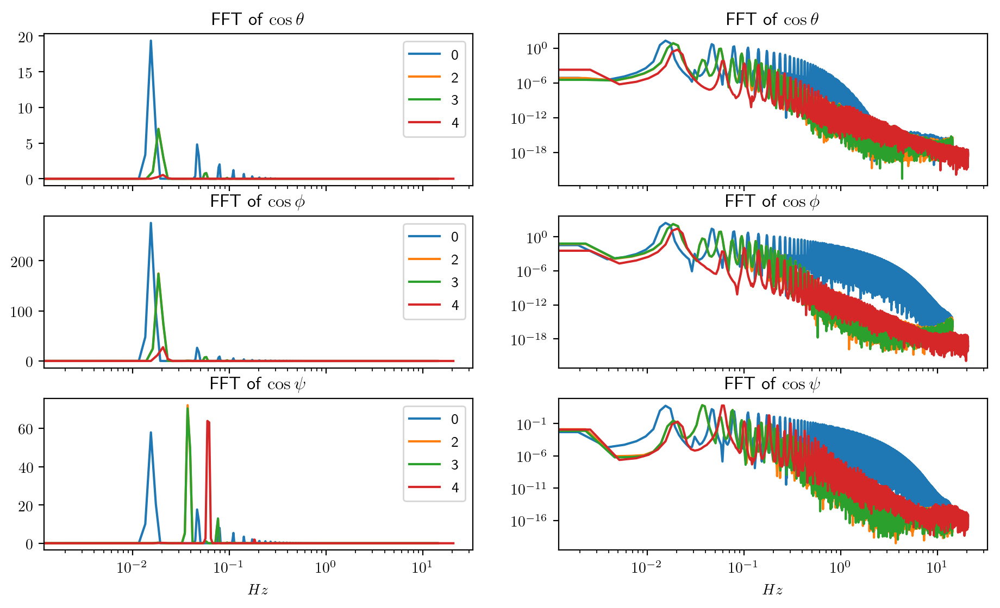

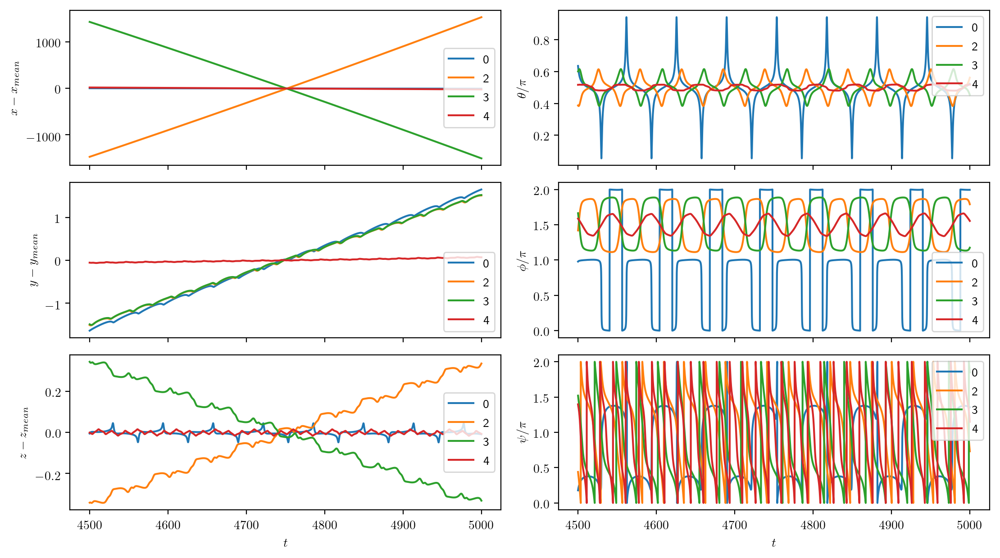

In [147]:
# import importlib
# importlib.reload(spf_tb)

tipical_th_ph_list = [[0.   , 1.714],
                      [0.000, 0.   ],
                      [0.143, 0.   ],
                      [0.143, 0.428],
                      [0.143, 0.571]]

tipical_th_ph_use_idx = [0, 2, 3, 4, ]
Table_t_range = np.array((4500, np.inf))
figsize = np.array((16, 9)) * 0.7
dpi = 200

tipical_th_ph_list_use = np.array(tipical_th_ph_list)[tipical_th_ph_use_idx]
label_list = np.arange(len(tipical_th_ph_list))[tipical_th_ph_use_idx]
spf_tb.show_table_theta_phi_psi_fft_list(tipical_th_ph_list_use, job_dir, label_list=label_list, figsize=figsize, dpi=dpi, 
                                         use_welch=True)
spf_tb.show_table_result_list(tipical_th_ph_list_use, job_dir, label_list=label_list, Table_t_range=Table_t_range,
                              figsize=figsize, dpi=dpi)

In [92]:
psi_lim_fct = 20
resampling_fct = 10
figsize = np.array((16, 9)) * 0.7
dpi = 200

# case_path_list = separate_fre_path_v2(type_fre2)
# color_list =     [np.array(plt.get_cmap('tab20', len(check_fre_list))(i0)[:3]).reshape((1, 3)) 
#                   for i0 in np.arange(type_fre2.values.max() + 1)]
for idx, psi_lim1 in enumerate(np.linspace(0, 2 * np.pi, psi_lim_fct * 16, endpoint=False)[::psi_lim_fct]):
    psi_lim = (psi_lim1, psi_lim1 + 2 * np.pi / (psi_lim_fct * 16))
    # create fig
    desc = '$\\psi \\in [%.3f \\pi, %.3f \\pi)$' % ((psi_lim[0] / np.pi), (psi_lim[1] / np.pi))
    fig, ax1 = plt.subplots(1, 1, figsize=figsize, dpi=dpi, subplot_kw=dict(polar=True))
    n_xticks = 32
    xticks = np.arange(n_xticks)
    ax1.set_xticks(xticks / n_xticks * 2 * np.pi)
    ax1.set_xticklabels(['$\dfrac{%d}{%d}2\pi$' % (i0, n_xticks) for i0 in xticks])
    ax1.set_yticklabels([])
    ax1.set_ylim(0, np.pi)
    fig.suptitle(desc)
    fig.tight_layout(rect=[0, 0, 1, 0.95])
    
    for i0 in np.arange(type_fre2.values.max() + 1):
        # get case_path
        iidx = np.where(np.isclose(type_fre2.values, i0))
        theta = type_fre2.index.values[iidx[0]]
        phi = type_fre2.columns.values[iidx[1]]
        theta_phi_list = np.vstack((theta, phi)).T
        case_path = []
        for theta, phi in theta_phi_list[:]:
            t_headle = 'th%5.3f_ph%5.3f_(.*?).pickle' % (theta, phi)
            filename = [filename for filename in os.listdir(job_dir)
                        if re.match(t_headle, filename) is not None][0]
            case_path.append(os.path.join(PWD, job_dir, filename))
        
        # generate fig
        thandle = ''
        color = np.array(plt.get_cmap('tab20', int(type_fre2.values.max() + 1))(int(i0))[:3]).reshape((1, 3)) 
        spf_tb.draw_phase_map_theta(case_path, color, psi_lim, axs=[ax1, ], thandle=thandle, 
                                    resampling=True, resampling_fct=resampling_fct)
    tdir = os.path.join(PWD, job_dir, 'phase_mape_fre')
    if not os.path.exists(tdir):
        os.makedirs(tdir)
    figname = os.path.join(tdir, '%04d.png' % (idx))
    fig.savefig(os.path.join(tdir, figname))
    print('save to %s' % figname)
    plt.close(fig)


save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0000.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0001.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0002.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0003.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0004.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0005.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0006.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0007.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0008.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0009.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0010.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0011.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0012.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0013.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0014.png



save to /home/zhangji/stokes_flow_master/head_Force/do_calculate_table/ecoC01B05_passive_psi-0a/phase_mape_fre/0015.png


In [87]:
def _get_last_data_angle(job_dir, theta, phi, ntimes=10, resampling_fct=1):  
    base_pick, _ = spf_tb.load_table_date_pickle(job_dir, theta, phi)
    base_t = base_pick['Table_t']
    base_theta = base_pick['Table_theta']
    tmin = np.max((0, base_t.max() - 1000))
    idx = base_t > tmin
    freq_pk = spf_tb.get_major_fre(base_t[idx], base_theta[idx])
    idx = base_t > (base_t.max() - 1 / freq_pk * ntimes)
    base_t = base_pick['Table_t'][idx]
    base_theta = base_pick['Table_theta'][idx]
    base_phi = base_pick['Table_phi'][idx]
    base_psi = base_pick['Table_psi'][idx]
    t1 = int(np.around(1 / freq_pk * ntimes * 16 * resampling_fct))
    t_use = np.linspace(base_t.min(), base_t.max(), t1)
    base_theta = spf_tb.get_continue_angle(base_t, base_theta, t_use)
    base_phi = spf_tb.get_continue_angle(base_t, base_phi, t_use)
    base_psi = spf_tb.get_continue_angle(base_t, base_psi, t_use)
    return base_t, base_theta, base_phi, base_psi

i0 = 0
iidx = np.where(np.isclose(type_fre2.values, i0))
ttheta = type_fre2.index.values[iidx[0]][114]
tphi = type_fre2.columns.values[iidx[1]][114]
base_t, base_theta, base_phi, base_psi = _get_last_data_angle(job_dir, ttheta, tphi, ntimes=3)

In [91]:
def _get_last_data_angle(job_dir, theta, phi, ntimes=10, resampling_fct=1):  
    base_pick, _ = spf_tb.load_table_date_pickle(job_dir, theta, phi)
    base_t = base_pick['Table_t']
    base_theta = base_pick['Table_theta']
    tmin = np.max((0, base_t.max() - 1000))
    idx = base_t > tmin
    freq_pk = spf_tb.get_major_fre(base_t[idx], base_theta[idx])
    idx = base_t > (base_t.max() - 1 / freq_pk * ntimes)
    base_t = base_pick['Table_t'][idx]
    base_theta = base_pick['Table_theta'][idx]
    base_phi = base_pick['Table_phi'][idx]
    base_psi = base_pick['Table_psi'][idx]
    t1 = int(np.around(1 / freq_pk * ntimes * 16 * resampling_fct))
    t_use = np.linspace(base_t.min(), base_t.max(), t1)
    base_theta = spf_tb.get_continue_angle(base_t, base_theta, t_use)
    base_phi = spf_tb.get_continue_angle(base_t, base_phi, t_use)
    base_psi = spf_tb.get_continue_angle(base_t, base_psi, t_use)
    return base_t, base_theta, base_phi, base_psi

for i0 in np.arange(type_fre2.values.max() + 1)[:]:
    iidx = np.where(np.isclose(type_fre2.values, i0))
    ttheta = type_fre2.index.values[iidx[0]][0]
    tphi = type_fre2.columns.values[iidx[1]][0]
    base_t, base_theta, base_phi, base_psi = _get_last_data_angle(job_dir, ttheta, tphi, ntimes=3)

    base_theta2 = np.flipud(base_theta)
    for i1 in tqdm_notebook(np.arange(type_fre2.values.max() + 1)[:]):
        iidx = np.where(np.isclose(type_fre2.values, i1))
        theta = type_fre2.index.values[iidx[0]]
        phi = type_fre2.columns.values[iidx[1]]
        theta_phi_list = np.vstack((theta, phi)).T
        max_conv = []
        for theta, phi in theta_phi_list[:]:
            Table_t, Table_theta, Table_phi, Table_psi = _get_last_data_angle(job_dir, theta, phi, ntimes=5)
            t_conv = np.convolve(base_theta2, Table_theta, mode='valid')
            max_conv.append(t_conv.max())

    #         fig, axs = plt.subplots(1, 2)
    #         ax1 = axs[0]
    #         ax1.plot(t_conv)
    #         ax2 = axs[1]
    #         ax2.plot(Table_theta)
    #         ax2.plot(base_theta)
        max_conv = np.hstack(max_conv)
        print(max_conv.max(), max_conv.min(), max_conv.mean(), max_conv.std())

7749.28520819258 7748.618776944237 7749.1155248479 0.13377137411902312
7400.038797052863 3240.888847493316 7134.653961808037 1012.672043526715
7546.044607938832 7545.402514419695 7545.583043809143 0.10211923333703815
7521.0177677830625 7520.352789068261 7520.558324733812 0.12347136658523737
7413.739205571387 7411.862549329435 7412.6921963122695 0.44867593408241474



6052.216408907038 6052.20021221287 6052.205434512373 0.0036615840115229335
5905.230929393915 3112.168461845064 5727.287077955202 679.3945768919336
5968.319304014746 5967.622576082947 5967.819180693064 0.11086667287089046
5945.589212805495 5944.96163205561 5945.155942531468 0.11669693559223078
5903.1748704973115 5902.678495778813 5902.826945154305 0.1051494848633829



6375.542624935005 6375.518393936815 6375.536994165306 0.004885411316941505
6256.010774680132 3190.3733618357487 6059.835630566635 745.6349837149563
6317.509442066011 6316.665969189865 6317.271262230263 0.13432356400568146
6295.532415134577 6294.858464705363 6295.323633846017 0.1255015877401358
6267.441189111478 6265.522817249277 6266.338927608317 0.39312827987750604



6448.5258227728045 6448.310734200586 6448.461835861233 0.047307302503255794
6232.022919396386 3179.5982574997615 6037.650756578028 742.6670640986653
6319.293002531636 6318.48583035172 6318.711710423938 0.12805408885542435
6298.964188733923 6298.138888236298 6298.3923023323205 0.15320852910328492
6237.582894542261 6235.9591871582625 6236.9602972876755 0.2788927068014768



5874.936200363564 5874.910967084232 5874.929165448031 0.005391030153574146
5737.923667508214 3125.781109645151 5571.828677265097 635.2297655883905
5807.497875898874 5807.0739258428985 5807.193356197259 0.06742664914002454
5785.45276449156 5785.039688531401 5785.167513372071 0.07682169968477416
5738.318124614018 5737.346912043993 5737.73939489723 0.17378354798737447



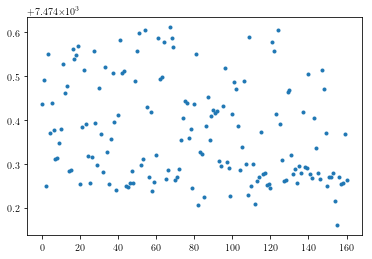

In [89]:
plt.plot(max_conv, '.')

In [73]:
np.convolve([1, 2, 3], [0, 1, 0.5])

array([0. , 1. , 2.5, 4. , 1.5])

In [74]:
np.dot([1, 2, 3], [0, 1, 0.5])

3.5